<a href="https://colab.research.google.com/github/z-arabi/8puzzle/blob/main/03_transformer_anatomy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Uncomment and run this cell if you're on Colab or Kaggle
!git clone https://github.com/nlp-with-transformers/notebooks.git
%cd notebooks
from install import *
install_requirements()

Cloning into 'notebooks'...
remote: Enumerating objects: 412, done.
remote: Counting objects: 100% (412/412), done.
remote: Compressing objects: 100% (307/307), done.
remote: Total 412 (delta 197), reused 265 (delta 99), pack-reused 0
Receiving objects: 100% (412/412), 24.36 MiB | 17.88 MiB/s, done.
Resolving deltas: 100% (197/197), done.
/content/notebooks
⏳ Installing base requirements ...
✅ Base requirements installed!
⏳ Installing Git LFS ...
✅ Git LFS installed!


In [2]:
#hide
from utils import *
setup_chapter()

Using transformers v4.11.3
Using datasets v1.16.1


# Transformer Anatomy

## The Transformer Architecture

## The Encoder

### Self-Attention

#### Scaled dot-product attention

#hide

Copy and execute the following cell magic in a new cell to use `bertviz` in JupyterLab:

```python
%%javascript
require.config({
  paths: {
      d3: '//cdnjs.cloudflare.com/ajax/libs/d3/3.4.8/d3.min',
      jquery: '//ajax.googleapis.com/ajax/libs/jquery/2.0.0/jquery.min',
  }
});
```

In [3]:
#hide_output
from transformers import AutoTokenizer
from bertviz.transformers_neuron_view import BertModel
from bertviz.neuron_view import show

model_ckpt = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
model = BertModel.from_pretrained(model_ckpt)
text = "time flies like an arrow"
show(model, "bert", tokenizer, text, display_mode="light", layer=0, head=8)

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

100%|██████████| 440473133/440473133 [00:22<00:00, 19299489.77B/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [4]:
text = "I bought apple phone yesterday. While I was eating apple, I started working with my apple phone."
show(model, "bert", tokenizer, text, display_mode="light", layer=0, head=8)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Sidebar: Demystifying Queries, Keys, and Values

### End sidebar

In [5]:
# hide
from transformers import AutoTokenizer
model_ckpt = "bert-base-uncased"
text = "time flies like an arrow"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)

In [6]:
inputs = tokenizer(text, return_tensors="pt", add_special_tokens=False)
print(inputs)
print(inputs.input_ids)

# can conver just one token
tokens = tokenizer.convert_ids_to_tokens(torch.squeeze(inputs.input_ids))
print(tokens)

{'input_ids': tensor([[ 2051, 10029,  2066,  2019,  8612]]), 'token_type_ids':
tensor([[0, 0, 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1]])}
tensor([[ 2051, 10029,  2066,  2019,  8612]])
['time', 'flies', 'like', 'an', 'arrow']


In [7]:
from torch import nn
from transformers import AutoConfig

config = AutoConfig.from_pretrained(model_ckpt)
# create embedding layer
token_emb = nn.Embedding(config.vocab_size, config.hidden_size)
token_emb

Embedding(30522, 768)

In [8]:
print(inputs.input_ids.size())
inputs_embeds = token_emb(inputs.input_ids)
inputs_embeds.size()

torch.Size([1, 5])


torch.Size([1, 5, 768])

In [9]:
key = inputs_embeds
print(key.size())
# just over index 1,2
print(key.transpose(1,2).size())

torch.Size([1, 5, 768])
torch.Size([1, 768, 5])


In [10]:
import torch
from math import sqrt 

query = key = value = inputs_embeds
dim_k = key.size(-1)
# batched_matrix_multiplication
scores = torch.bmm(query, key.transpose(1,2)) / sqrt(dim_k)
scores.size()

torch.Size([1, 5, 5])

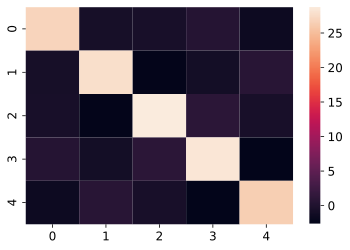

In [11]:
import seaborn as sns
sns.heatmap(torch.squeeze(scores).detach().numpy())

In [12]:
import torch.nn.functional as F

weights = F.softmax(scores, dim=-1)
print(weights)

# each row and each column has sum of 1
print(weights.sum(dim=-1))
weights.sum(dim=-2)

tensor([[[1.0000e+00, 9.8701e-13, 1.1214e-12, 3.3379e-12, 4.1036e-13],
         [4.4247e-13, 1.0000e+00, 8.0089e-14, 3.5161e-13, 1.8911e-12],
         [1.7151e-13, 2.7323e-14, 1.0000e+00, 8.6942e-13, 1.6911e-13],
         [7.7259e-13, 1.8154e-13, 1.3158e-12, 1.0000e+00, 3.3531e-14],
         [6.5929e-13, 6.7773e-12, 1.7765e-12, 2.3275e-13, 1.0000e+00]]],
       grad_fn=<SoftmaxBackward0>)
tensor([[1., 1., 1., 1., 1.]], grad_fn=<SumBackward1>)


tensor([[1., 1., 1., 1., 1.]], grad_fn=<SumBackward1>)

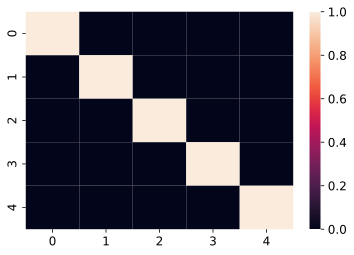

In [13]:
# weights is attention matrix with softmax
# at above we have slight different between similar words relationship > here is strict
sns.heatmap(torch.squeeze(weights).detach().numpy())

In [14]:
attn_outputs = torch.bmm(weights, value)
attn_outputs.shape

torch.Size([1, 5, 768])

In [15]:
def scaled_dot_product_attention(query, key, value):
    dim_k = query.size(-1)
    scores = torch.bmm(query, key.transpose(1, 2)) / sqrt(dim_k)
    weights = F.softmax(scores, dim=-1)
    return torch.bmm(weights, value)

#### Multi-headed attention

In [16]:
embed_dim = config.hidden_size
num_heads = config.num_attention_heads
print(f"{embed_dim}, the number of heads {num_heads}")
head_dim = embed_dim // num_heads
print(head_dim)

q = nn.Linear(embed_dim, head_dim)
print(q)

768, the number of heads 12
64
Linear(in_features=768, out_features=64, bias=True)


In [17]:
class AttentionHead(nn.Module):
    # in init you create > in forward you set the forward calculation
    def __init__(self, embed_dim, head_dim):
        super().__init__()
        self.q = nn.Linear(embed_dim, head_dim)
        self.k = nn.Linear(embed_dim, head_dim)
        self.v = nn.Linear(embed_dim, head_dim)

    def forward(self, hidden_state):
        attn_outputs = scaled_dot_product_attention(
            self.q(hidden_state), self.k(hidden_state), self.v(hidden_state))
        return attn_outputs

In [18]:
class MultiHeadAttention(nn.Module):
    def __init__(self, config):
        super().__init__()
        embed_dim = config.hidden_size
        num_heads = config.num_attention_heads
        head_dim = embed_dim // num_heads
        self.heads = nn.ModuleList(
            [AttentionHead(embed_dim, head_dim) for _ in range(num_heads)]
        )
        self.output_linear = nn.Linear(embed_dim, embed_dim)

    def forward(self, hidden_state):
        x = torch.cat([h(hidden_state) for h in self.heads], dim=-1)
        x = self.output_linear(x)
        return x

In [19]:
multihead_attn = MultiHeadAttention(config)
# input embedding is hidden state
attn_output = multihead_attn(inputs_embeds)    
attn_output.size() 

torch.Size([1, 5, 768])

In [20]:
#hide_output
from bertviz import head_view
from transformers import AutoModel

model = AutoModel.from_pretrained(model_ckpt, output_attentions=True)

Downloading:   0%|          | 0.00/420M [00:00<?, ?B/s]

In [21]:
sentence_a = "time flies like an arrow"
sentence_b = "fruit flies like a banana"

viz_inputs = tokenizer(sentence_a, sentence_b, return_tensors='pt')
print(viz_inputs)
attention = model(**viz_inputs).attentions
sentence_b_start = (viz_inputs.token_type_ids == 0).sum(dim=1)
print(sentence_b_start)
tokens = tokenizer.convert_ids_to_tokens(viz_inputs.input_ids[0])

head_view(attention, tokens, sentence_b_start, heads=[8])

{'input_ids': tensor([[  101,  2051, 10029,  2066,  2019,  8612,   102,  5909,
10029,  2066,
          1037, 15212,   102]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0,
1, 1, 1, 1, 1, 1]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
1, 1]])}
tensor([7])


<IPython.core.display.Javascript object>

### The Feed-Forward Layer

In [22]:
print(config.intermediate_size)
print(config.hidden_size)
print(config.hidden_dropout_prob)

3072
768
0.1


In [23]:
class FeedForward(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.linear_1 = nn.Linear(config.hidden_size, config.intermediate_size)
        self.linear_2 = nn.Linear(config.intermediate_size, config.hidden_size)
        self.gelu = nn.GELU()
        self.dropout = nn.Dropout(config.hidden_dropout_prob)
        
    def forward(self, x):
        x = self.linear_1(x)
        x = self.gelu(x)
        x = self.linear_2(x)
        x = self.dropout(x)
        return x

In [24]:
feed_forward = FeedForward(config)
ff_outputs = feed_forward(attn_outputs)
ff_outputs.size()

torch.Size([1, 5, 768])

### Adding Layer Normalization

In [25]:
class TransformerEncoderLayer(nn.Module):
    def __init__(self, config):
        super().__init__()
        # all of the inputs of layers are hidden_size
        self.layer_norm_1 = nn.LayerNorm(config.hidden_size)
        self.layer_norm_2 = nn.LayerNorm(config.hidden_size)
        self.attention = MultiHeadAttention(config)
        self.feed_forward = FeedForward(config)

    def forward(self, x):
        # Apply layer normalization and then copy input into query, key, value
        hidden_state = self.layer_norm_1(x)
        # Apply attention with a skip connection
        x = x + self.attention(hidden_state)
        # Apply feed-forward layer with a skip connection
        x = x + self.feed_forward(self.layer_norm_2(x))
        return x

In [26]:
encoder_layer = TransformerEncoderLayer(config)
inputs_embeds.shape, encoder_layer(inputs_embeds).size()

(torch.Size([1, 5, 768]), torch.Size([1, 5, 768]))

### Positional Embeddings

In [27]:
print(config.max_position_embeddings)

position_ids = torch.arange(5, dtype=torch.long).unsqueeze(0)
print(position_ids)

512
tensor([[0, 1, 2, 3, 4]])


In [28]:
class Embeddings(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.token_embeddings = nn.Embedding(config.vocab_size, 
                                             config.hidden_size)
        self.position_embeddings = nn.Embedding(config.max_position_embeddings,
                                                config.hidden_size)
        self.layer_norm = nn.LayerNorm(config.hidden_size, eps=1e-12)
        self.dropout = nn.Dropout()

    def forward(self, input_ids):
        # Create position IDs for input sequence
        # 5 < 512
        seq_length = input_ids.size(1)
        position_ids = torch.arange(seq_length, dtype=torch.long).unsqueeze(0)
        # Create token and position embeddings
        token_embeddings = self.token_embeddings(input_ids)
        position_embeddings = self.position_embeddings(position_ids)
        # Combine token and position embeddings
        embeddings = token_embeddings + position_embeddings
        embeddings = self.layer_norm(embeddings)
        embeddings = self.dropout(embeddings)
        return embeddings

In [29]:
embedding_layer = Embeddings(config)
embedding_layer(inputs.input_ids).size()

torch.Size([1, 5, 768])

In [30]:
print(f"number of stacks: {config.num_hidden_layers}; number of heads: {config.num_attention_heads}")

number of stacks: 12; number of heads: 12


In [31]:
class TransformerEncoder(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embeddings = Embeddings(config)
        self.layers = nn.ModuleList([TransformerEncoderLayer(config) 
                                     for _ in range(config.num_hidden_layers)])

    def forward(self, x):
        x = self.embeddings(x)
        for layer in self.layers:
            x = layer(x)
        return x

In [32]:
encoder = TransformerEncoder(config)
encoder(inputs.input_ids).size()

torch.Size([1, 5, 768])

### Adding a Classification Head

In [33]:
class TransformerForSequenceClassification(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.encoder = TransformerEncoder(config)
        self.dropout = nn.Dropout(config.hidden_dropout_prob)
        self.classifier = nn.Linear(config.hidden_size, config.num_labels)
        
    def forward(self, x):
        x = self.encoder(x)[:, 0, :] # select hidden state of [CLS] token
        x = self.dropout(x)
        x = self.classifier(x)
        return x

In [34]:
config.num_labels = 3
encoder_classifier = TransformerForSequenceClassification(config)
encoder_classifier(inputs.input_ids).size()

torch.Size([1, 3])

## The Decoder

In [35]:
seq_len = inputs.input_ids.size(-1)
mask = torch.tril(torch.ones(seq_len, seq_len)).unsqueeze(0)
print(mask.size())
mask[0]

torch.Size([1, 5, 5])


tensor([[1., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0.],
        [1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1.]])

In [36]:
scores.masked_fill(mask == 0, -float("inf"))

tensor([[[26.8592,    -inf,    -inf,    -inf,    -inf],
         [-0.7849, 27.6615,    -inf,    -inf,    -inf],
         [-0.6572, -2.4941, 28.7370,    -inf,    -inf],
         [ 0.4336, -1.0147,  0.9660, 28.3226,    -inf],
         [-1.6625,  0.6677, -0.6713, -2.7037, 26.3851]]],
       grad_fn=<MaskedFillBackward0>)

In [37]:
def scaled_dot_product_attention(query, key, value, mask=None):
    dim_k = query.size(-1)
    scores = torch.bmm(query, key.transpose(1, 2)) / sqrt(dim_k)
    if mask is not None:
        scores = scores.masked_fill(mask == 0, float("-inf"))
    weights = F.softmax(scores, dim=-1)
    return weights.bmm(value)

In [38]:
'''
the whole implementation > all the previous steps
just one step added to have masked 
classification > like classification head But
the output size is num of vacabs > the one has the high probability 
is the next token

while you get to the [SEP] repeat the process of encoding
The whole implementation must be coded ???????
'''

'\nthe whole implementation > all the previous steps\njust one step added to have masked \nclassification > like classification head But\nthe output size is num of vacabs > the one has the high probability \nis the next token\n\nwhile you get to the [SEP] repeat the process of encoding\nThe whole implementation must be coded ???????\n'

### Sidebar: Demystifying Encoder-Decoder Attention

### End sidebar

## Meet the Transformers

### The Transformer Tree of Life

### The Encoder Branch

### The Decoder Branch

### The Encoder-Decoder Branch

## Conclusion